In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from tensorflow import keras
from keras.preprocessing import image
from keras.applications import InceptionV3

In [3]:
def download(url):
    name = url.split("/")[-1]
    image_path = keras.utils.get_file(name, origin=url)
    img = image.load_img(image_path)
    return image.img_to_array(img)

In [4]:
# 전처리
def preprocess(img):
    return (img / 127.5) - 1

In [5]:
#전처리 취소
def deprocess(img):
    img = img.copy()
    img /= 2.
    img += 0.5
    img *= 255.
    return np.clip(img, 0, 255).astype('uint8')

In [6]:
def show(img):
    plt.figure(figsize=(12, 12))
    plt.grid(False)
    plt.axis('off')
    plt.imshow(img)

In [7]:
def clear_output():
    url = 'https://storage.googleapis.com/applied-dl/clouds.jpg'
    img = preprocess(download(url))
    show(deprocess(img))

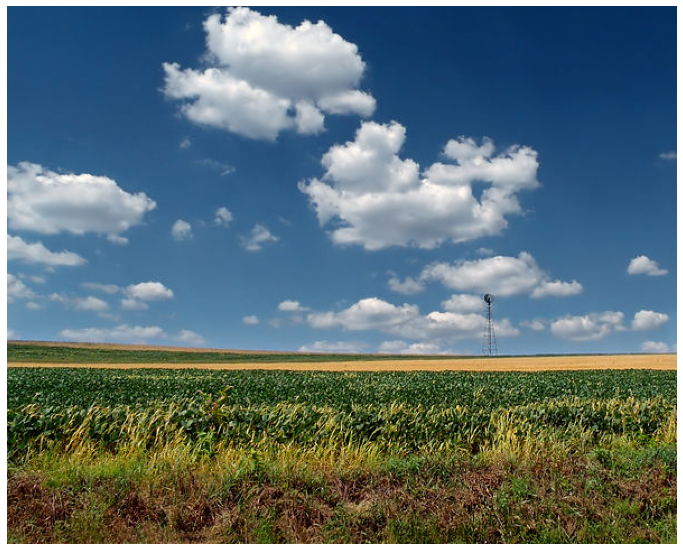

In [8]:
# https://commons.wikimedia.org/wiki/File:Flickr_-_Nicholas_T_-_Big_Sky_(1).jpg

url = 'https://storage.googleapis.com/applied-dl/clouds.jpg'
img = preprocess(download(url))
show(deprocess(img))

In [9]:
inception_v3 = InceptionV3(include_top=False)

In [10]:
names = ['mixed2', 'mixed3', 'mixed4', 'mixed5']
layers = [inception_v3.get_layer(name).output for name in names]

In [11]:
feat_extraction_model = keras.Model(inputs=inception_v3.input, outputs = layers)

In [12]:
def foward(img):
    img_batch = tf.expand_dims(img, axis=0)
    
    return feat_extraction_model(img_batch)

In [13]:
def calc_loss(layer_activations):
    total_loss = 0
    for act in layer_activations:
        loss = tf.math.reduce_mean(act)
        
        loss /= np.prod(act.shape)
        total_loss += loss
    return total_loss

step 0, loss 0.000001


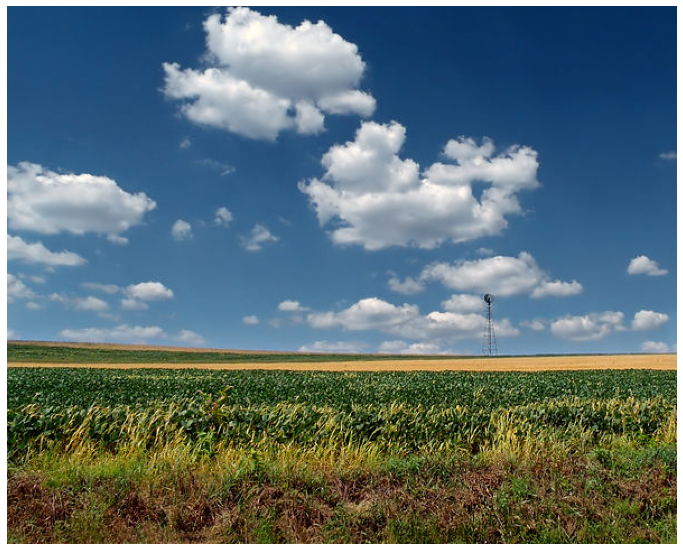

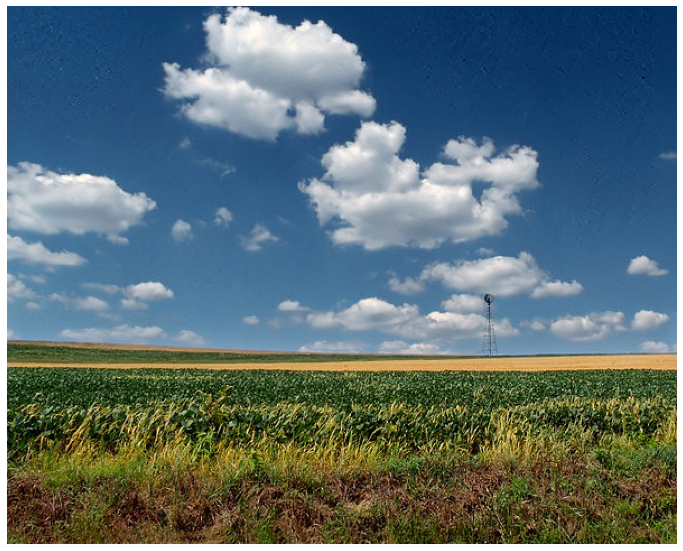

step 50, loss 0.000003


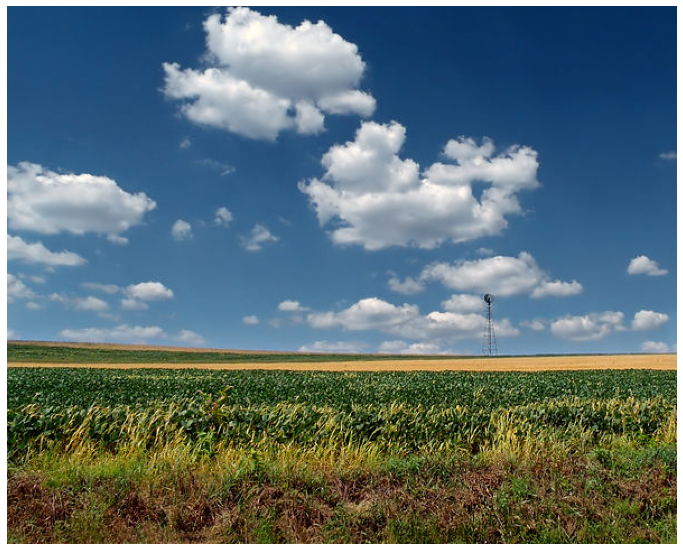

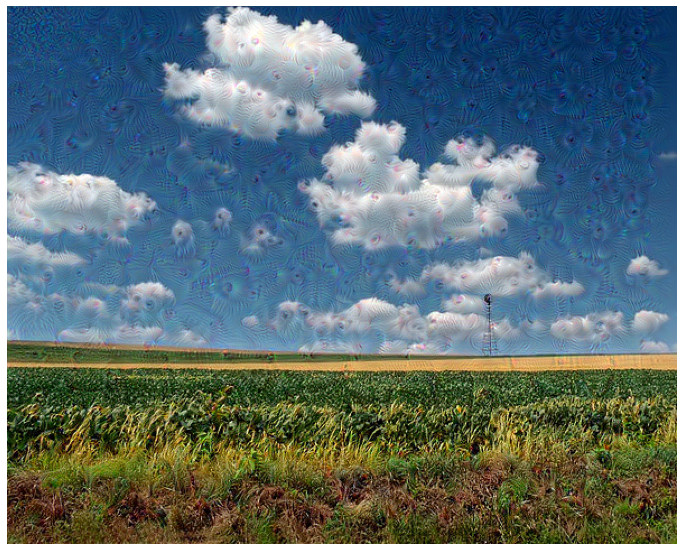

step 100, loss 0.000004


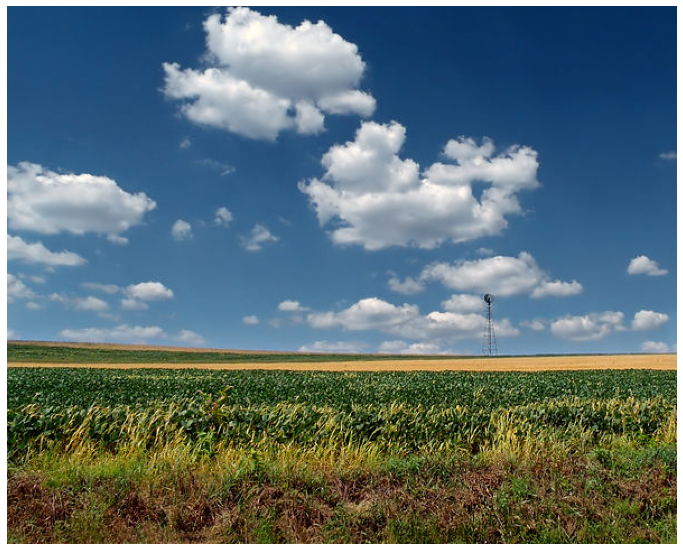

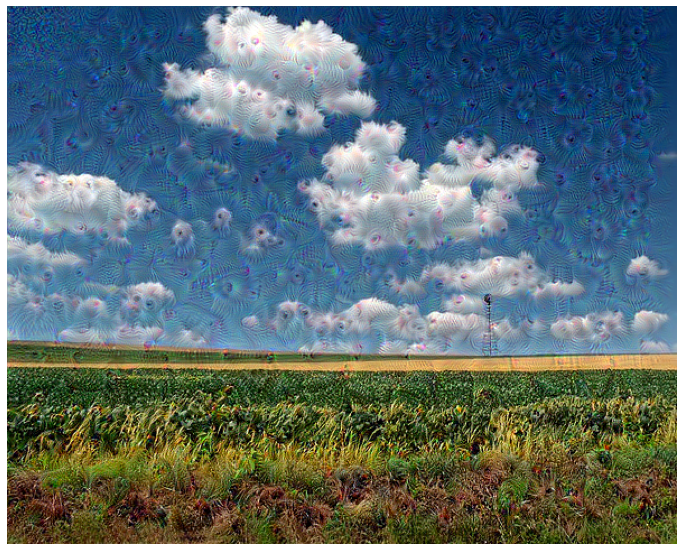

step 150, loss 0.000004


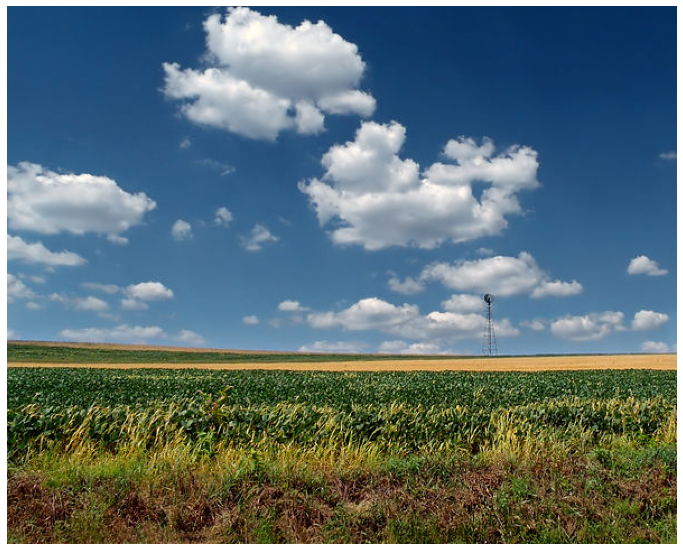

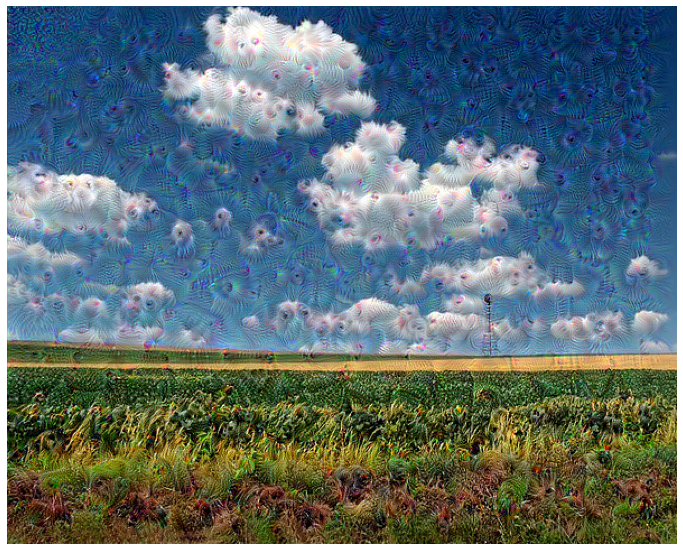

step 200, loss 0.000004


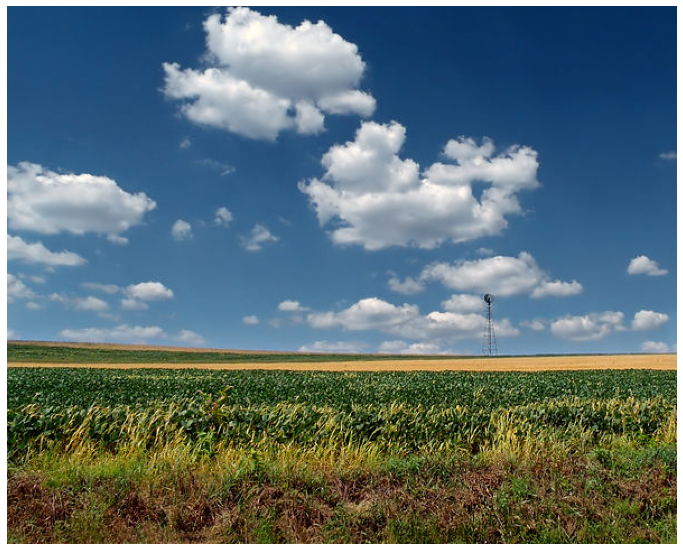

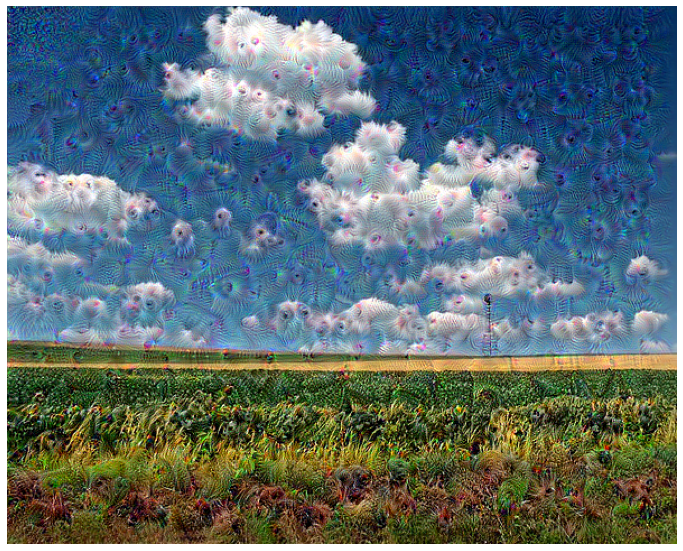

step 250, loss 0.000004


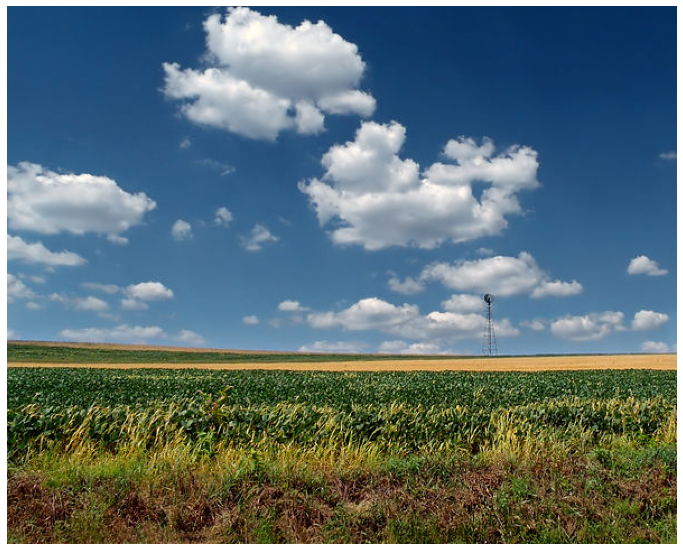

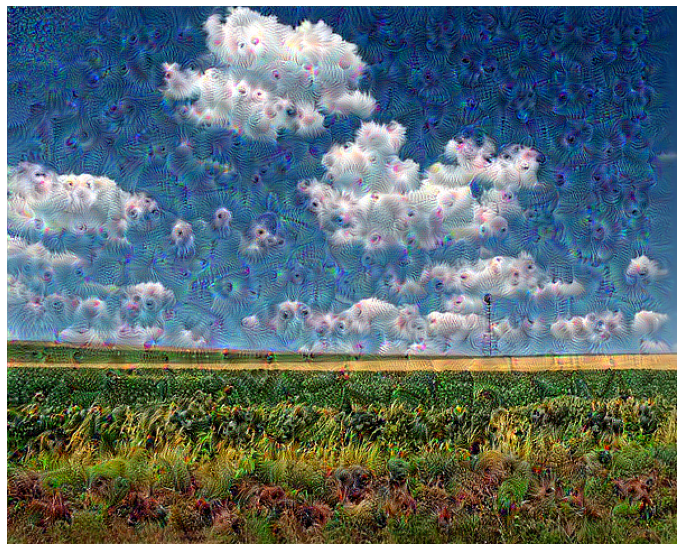

step 300, loss 0.000005


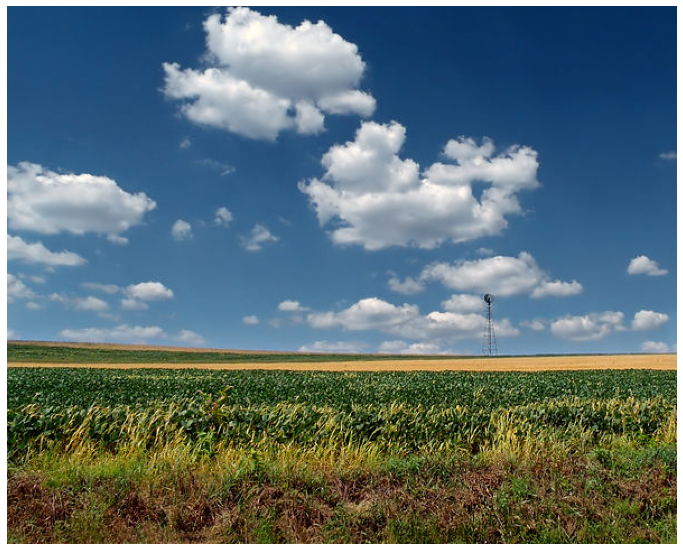

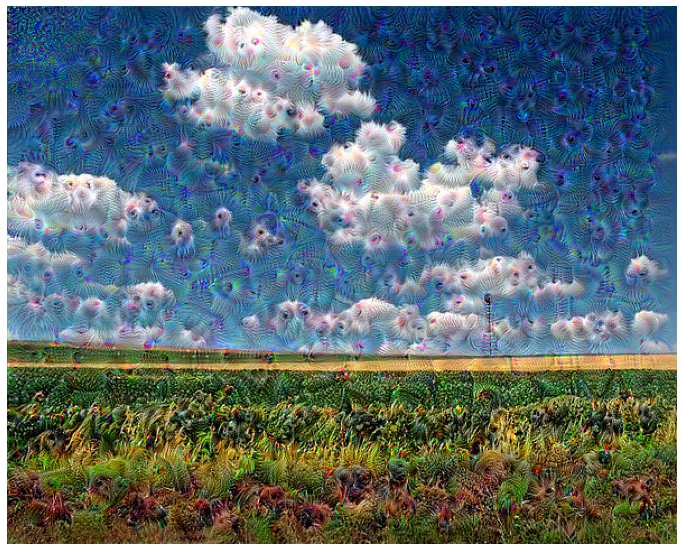

step 350, loss 0.000005


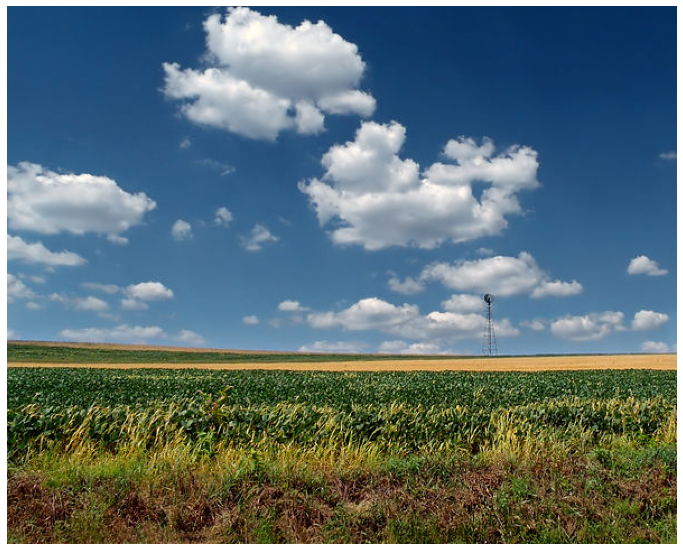

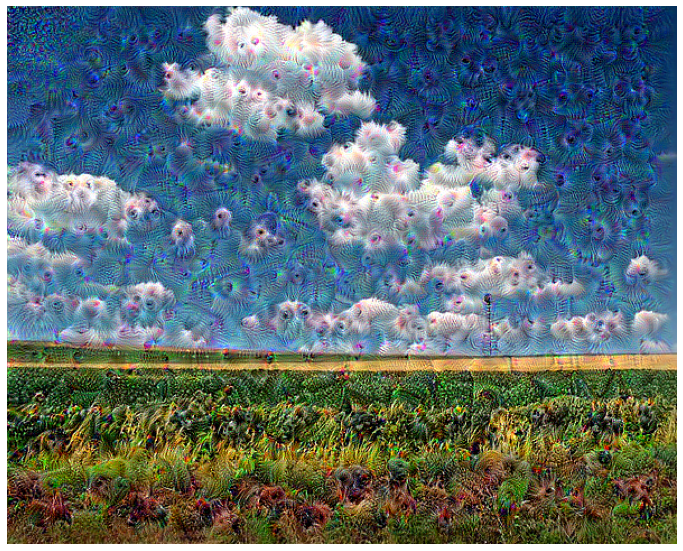

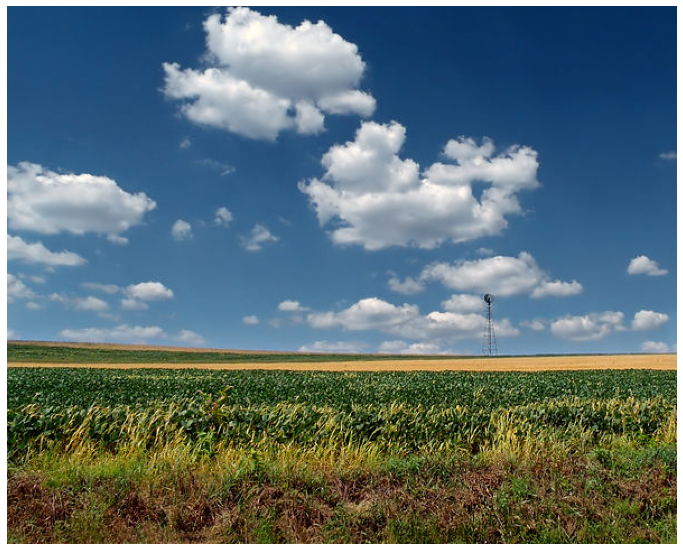

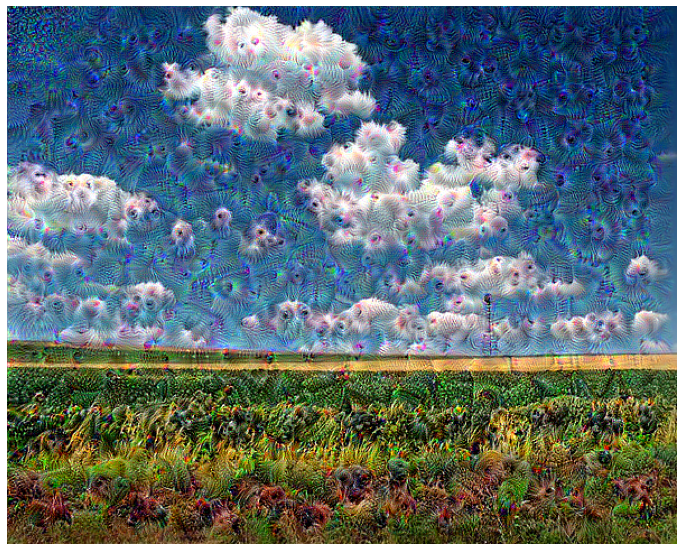

In [14]:
img = tf.Variable(img)
steps = 400

for step in range(steps):
    
    with tf.GradientTape() as tape:
        activations = foward(img)
        loss = calc_loss(activations)
        
    gradients = tape.gradient(loss, img)
    
    # 정규화
    gradients /= gradients.numpy().std() + 1e-8
    # 그래디언트를 더하여 갱신
    img.assign_add(gradients)
    
    if step % 50 == 0:
        clear_output()
        print("step %d, loss %f"%(step, loss))
        show(deprocess(img.numpy()))
        plt.show()
        
clear_output()
show(deprocess(img.numpy()))